In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
##!pip install pandas-profiling

In [2]:
fraudTest=pd.read_csv('fraudTest.csv')
fraudTrain=pd.read_csv('fraudTrain.csv')

In [3]:
fraudTest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 23 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             555719 non-null  int64  
 1   trans_date_trans_time  555719 non-null  object 
 2   cc_num                 555719 non-null  int64  
 3   merchant               555719 non-null  object 
 4   category               555719 non-null  object 
 5   amt                    555719 non-null  float64
 6   first                  555719 non-null  object 
 7   last                   555719 non-null  object 
 8   gender                 555719 non-null  object 
 9   street                 555719 non-null  object 
 10  city                   555719 non-null  object 
 11  state                  555719 non-null  object 
 12  zip                    555719 non-null  int64  
 13  lat                    555719 non-null  float64
 14  long                   555719 non-nu

In [4]:
fraudTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

In [5]:
frd= pd.concat([fraudTrain,fraudTest],ignore_index=True)

# EDA

In [61]:
from pandas_profiling import ProfileReport
prof = ProfileReport(frd)
prof

C:\Users\Asus\AppData\Local\Temp\ipykernel_5444\3763320337.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
#generate 'hour'
hour = frd.trans_date_trans_time.str.slice(-8, -6).astype(int)
frd['trans_hour'] = hour

In [8]:
# generate 'month'
dt_month = hour = frd.trans_date_trans_time.str.slice(5, 7).astype(int)
frd['trans_month'] = dt_month

In [9]:
# genarate 'age'
age = frd.dob.apply(lambda x: 2023 - int(x[:4]))
frd['age'] = age


In [10]:
#generate 'distance': Geographical distance between merchant and card holder
from datetime import datetime, timedelta
 
# handy function from the article
def haversine_vectorize(long, lat, merch_long, merch_lat):
    """Returns distance, in kilometers, between one set of longitude/latitude coordinates and another"""
    long, lat, merch_long, merch_lat = map(np.radians, [long, lat, merch_long, merch_lat])
 
    newlon = merch_long - long
    newlat = merch_lat - lat
 
    haver_formula = np.sin(newlat/2.0)**2 + np.cos(lat) * np.cos(merch_lat) * np.sin(newlon/2.0)**2
 
    dist = 2 * np.arcsin(np.sqrt(haver_formula ))
    km = 6371 * dist #6367 for distance in KM for miles use 3958
    return km

frd['haversine_dist'] = haversine_vectorize(frd.long, frd.lat, frd.merch_long, frd.merch_lat)

In [11]:
frd

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_hour,trans_month,age,haversine_dist
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,1,35,78.597568
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,1,45,30.212176
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,1,61,108.206083
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,1,56,95.673231
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,1,37,77.556744
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1852389,555714,2020-12-31 23:59:07,30560609640617,fraud_Reilly and Sons,health_fitness,43.77,Michael,Olson,M,558 Michael Estates,...,1966-02-13,9b1f753c79894c9f4b71f04581835ada,1388534347,39.946837,-91.333331,0,23,12,57,77.026148
1852390,555715,2020-12-31 23:59:09,3556613125071656,fraud_Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,M,572 Davis Mountains,...,1999-12-27,2090647dac2c89a1d86c514c427f5b91,1388534349,29.661049,-96.186633,0,23,12,24,100.074420
1852391,555716,2020-12-31 23:59:15,6011724471098086,fraud_Rau-Robel,kids_pets,86.88,Ann,Lawson,F,144 Evans Islands Apt. 683,...,1981-11-29,6c5b7c8add471975aa0fec023b2e8408,1388534355,46.658340,-119.715054,0,23,12,42,80.759302
1852392,555717,2020-12-31 23:59:24,4079773899158,fraud_Breitenberg LLC,travel,7.99,Eric,Preston,M,7020 Doyle Stream Apt. 951,...,1965-12-15,14392d723bb7737606b2700ac791b7aa,1388534364,44.470525,-117.080888,0,23,12,58,52.933240


In [12]:
#gender
gender_no_frd = frd[frd['is_fraud']==0].groupby('gender')['trans_num'].count().reset_index()
gender_no_frd.rename(columns={'trans_num':'no_fraud'},inplace =True)

gender_frd = frd[frd['is_fraud']==1].groupby('gender')['trans_num'].count().reset_index()
gender_frd.rename(columns={'trans_num':'fraud'},inplace =True)

gender_frd = gender_frd.merge(gender_no_frd, on ='gender', how = 'left')
gender_frd['%fraud']= gender_frd['fraud']/(gender_frd['fraud'] + gender_frd['no_fraud'])
gender_frd['%no_fraud']= gender_frd['no_fraud']/(gender_frd['fraud'] + gender_frd['no_fraud'])
gender_frd

,gender,fraud,no_fraud,%fraud,%no_fraud
0,F,4899,1009850,0.004828,0.995172
1,M,4752,832893,0.005673,0.994327


In [13]:
#job
job_no_frd = frd[frd['is_fraud']==0].groupby('job')['trans_num'].count().reset_index()
job_no_frd.rename(columns={'trans_num':'no_fraud'},inplace = True)

job_frd = frd[frd['is_fraud']==1].groupby('job')['trans_num'].count().reset_index()
job_frd.rename(columns={'trans_num':'fraud'},inplace = True)

job_df = job_frd.merge(job_no_frd, on='job', how ='left')
job_df[['fraud','no_fraud']] = job_df[['fraud','no_fraud']].fillna(0)

job_df['%fraud'] = job_df['fraud']/(job_df['fraud'] + job_df['no_fraud'])
job_df



,job,fraud,no_fraud,%fraud
0,Academic librarian,11,1456.0,0.007498
1,"Accountant, chartered",11,0.0,1.000000
2,"Accountant, chartered certified",21,730.0,0.027963
3,"Accountant, chartered public finance",9,3648.0,0.002461
4,Accounting technician,33,6562.0,0.005004
...,...,...,...,...
489,Water engineer,13,8727.0,0.001487
490,Water quality scientist,7,727.0,0.009537
491,Web designer,18,3644.0,0.004915
492,Wellsite geologist,32,3637.0,0.008722


In [14]:
job_df.sort_values(by='%fraud',ascending=False)

,job,fraud,no_fraud,%fraud
226,Homeopath,11,0.0,1.000000
1,"Accountant, chartered",11,0.0,1.000000
200,Forest/woodland manager,9,0.0,1.000000
425,Software engineer,11,0.0,1.000000
421,Ship broker,7,0.0,1.000000
...,...,...,...,...
123,"Designer, furniture",5,4367.0,0.001144
122,"Designer, exhibition/display",4,4374.0,0.000914
434,Statistician,3,3642.0,0.000823
217,Health physicist,3,4371.0,0.000686


In [15]:
job_df['%fraud'].describe()

count    494.000000
mean       0.050788
std        0.205185
min        0.000458
25%        0.004039
50%        0.005466
75%        0.008163
max        1.000000
Name: %fraud, dtype: float64

In [16]:
job_df[job_df['%fraud']==1]['%fraud'].count()

22

<Axes: >

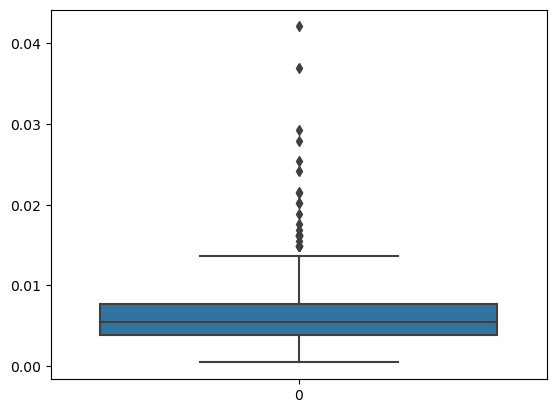

In [17]:
sns.boxplot(data=job_df[job_df['%fraud']<1]['%fraud'])

In [18]:
job_df[job_df['%fraud']<1]['%fraud'].describe()

count    472.000000
mean       0.006545
std        0.004564
min        0.000458
25%        0.003842
50%        0.005451
75%        0.007749
max        0.042105
Name: %fraud, dtype: float64

In [19]:
x = job_df[job_df['%fraud']<1]['%fraud'].tolist()
y = np.nanpercentile(x,99)
y

0.02456347833607198

In [20]:
job_filter = job_df[job_df['%fraud']>y]
job_filter

,job,fraud,no_fraud,%fraud
1,"Accountant, chartered",11,0.0,1.000000
2,"Accountant, chartered certified",21,730.0,0.027963
20,Air traffic controller,17,0.0,1.000000
35,Armed forces technical officer,8,0.0,1.000000
51,Broadcast journalist,9,0.0,1.000000
61,Careers adviser,15,0.0,1.000000
98,Community development worker,22,729.0,0.029294
106,Contracting civil engineer,7,0.0,1.000000
117,Dancer,19,0.0,1.000000
170,"Engineer, site",12,0.0,1.000000


In [21]:
job_filter.sort_values('%fraud', ascending = False)

,job,fraud,no_fraud,%fraud
1,"Accountant, chartered",11,0.0,1.000000
226,Homeopath,11,0.0,1.000000
482,Veterinary surgeon,8,0.0,1.000000
427,Solicitor,11,0.0,1.000000
425,Software engineer,11,0.0,1.000000
421,Ship broker,7,0.0,1.000000
405,Sales promotion account executive,14,0.0,1.000000
332,Personnel officer,12,0.0,1.000000
318,Operational investment banker,11,0.0,1.000000
266,Legal secretary,12,0.0,1.000000


In [22]:
frd['job'] = frd['job'].apply(lambda x: 'Others' if x not in job_filter['job'].tolist() else x)

In [23]:
frd['job'].describe()

count     1852394
unique         28
top        Others
freq      1848392
Name: job, dtype: object

In [24]:
#category
cat_no_frd = frd[frd['is_fraud']==0].groupby('category')['trans_num'].count().reset_index()
cat_no_frd.rename(columns={'trans_num':'no_fraud'},inplace = True)

cat_frd = frd[frd['is_fraud']==1].groupby('category')['trans_num'].count().reset_index()
cat_frd.rename(columns={'trans_num':'fraud'},inplace = True)

cat_df = cat_frd.merge(cat_no_frd, on='category', how ='left')
#cat_df[['fraud','no_fraud']] = cat_df[['fraud','no_fraud']].fillna(0)

cat_df['%fraud'] = cat_df['fraud']/(cat_df['fraud'] + cat_df['no_fraud'])

cat_df.sort_values('%fraud', ascending = False)

,category,fraud,no_fraud,%fraud
11,shopping_net,2219,137103,0.015927
8,misc_net,1182,89472,0.013039
4,grocery_pos,2228,173963,0.012645
12,shopping_pos,1056,165407,0.006344
2,gas_transport,772,187257,0.004106
9,misc_pos,322,113907,0.002819
3,grocery_net,175,64703,0.002697
13,travel,156,57800,0.002692
10,personal_care,290,129795,0.002229
0,entertainment,292,133826,0.002177


<Axes: >

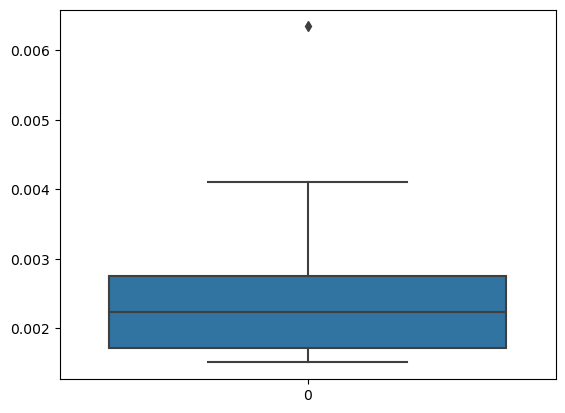

In [25]:
sns.boxplot(data=cat_df[cat_df['%fraud']<0.01]['%fraud'])

In [26]:
#hour
hour_no_frd = frd[frd['is_fraud']==0].groupby('trans_hour')['trans_num'].count().reset_index()
hour_no_frd.rename(columns={'trans_num':'no_fraud'},inplace = True)

hour_frd = frd[frd['is_fraud']==1].groupby('trans_hour')['trans_num'].count().reset_index()
hour_frd.rename(columns={'trans_num':'fraud'},inplace = True)

hour_df = hour_frd.merge(hour_no_frd, on='trans_hour', how ='left')
#hour_df[['fraud','no_fraud']] = hour_df[['fraud','no_fraud']].fillna(0)

hour_df['%fraud'] = hour_df['fraud']/(hour_df['fraud'] + hour_df['no_fraud'])
hour_df = hour_df.sort_values(by='%fraud',ascending=False)
hour_df

,trans_hour,fraud,no_fraud,%fraud
22,22,2481,92889,0.026014
23,23,2442,93460,0.025463
0,0,823,59832,0.013569
1,1,827,60503,0.013484
3,3,803,60165,0.013171
2,2,793,60003,0.013044
5,5,80,60008,0.001331
7,7,72,60229,0.001194
18,18,111,93941,0.001180
19,19,105,93328,0.001124


In [27]:
#month
month_no_frd = frd[frd['is_fraud']==0].groupby('trans_month')['trans_num'].count().reset_index()
month_no_frd.rename(columns={'trans_num':'no_fraud'},inplace = True)

month_frd = frd[frd['is_fraud']==1].groupby('trans_month')['trans_num'].count().reset_index()
month_frd.rename(columns={'trans_num':'fraud'},inplace = True)

month_df = month_frd.merge(month_no_frd, on='trans_month', how ='left')
#month_df[['fraud','no_fraud']] = month_df[['fraud','no_fraud']].fillna(0)

month_df['%fraud'] = month_df['fraud']/(month_df['fraud'] + month_df['no_fraud'])
month_df = month_df.sort_values(by='%fraud',ascending=False)
month_df

,trans_month,fraud,no_fraud,%fraud
1,2,853,96804,0.008735
0,1,849,103878,0.008107
2,3,938,142851,0.006523
4,5,935,145940,0.006366
9,10,838,137268,0.006068
8,9,758,139427,0.005407
3,4,678,134292,0.005023
10,11,682,142374,0.004767
5,6,821,173048,0.004722
7,8,797,175321,0.004525


In [28]:
#ANOVA hypothesis test:
#Ho: The variables are not correlated with each other
from scipy.stats import f_oneway

In [29]:
# age vs is_fraud corr
CategoryGroupLists=frd.groupby('is_fraud')['age'].apply(list)
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  1.353945227567749e-51


In [30]:
# distance vs is_fraud corr
CategoryGroupLists2=frd.groupby('is_fraud')['haversine_dist'].apply(list)
AnovaResults2 = f_oneway(*CategoryGroupLists2)
print('P-Value for Anova is: ', AnovaResults2[1])

P-Value for Anova is:  0.6249571843789385


# Fearture selection

In [31]:
#fearture selection
frd1 = frd[['category','job','amt','trans_hour','trans_month', 'lat','long','merch_lat','merch_long','is_fraud','age']]

In [32]:
frd1

,category,job,amt,trans_hour,trans_month,lat,long,merch_lat,merch_long,is_fraud,age
0,misc_net,Others,4.97,0,1,36.0788,-81.1781,36.011293,-82.048315,0,35
1,grocery_pos,Others,107.23,0,1,48.8878,-118.2105,49.159047,-118.186462,0,45
2,entertainment,Others,220.11,0,1,42.1808,-112.2620,43.150704,-112.154481,0,61
3,gas_transport,Others,45.00,0,1,46.2306,-112.1138,47.034331,-112.561071,0,56
4,misc_pos,Others,41.96,0,1,38.4207,-79.4629,38.674999,-78.632459,0,37
...,...,...,...,...,...,...,...,...,...,...,...
1852389,health_fitness,Others,43.77,23,12,40.4931,-91.8912,39.946837,-91.333331,0,57
1852390,kids_pets,Others,111.84,23,12,29.0393,-95.4401,29.661049,-96.186633,0,24
1852391,kids_pets,Others,86.88,23,12,46.1966,-118.9017,46.658340,-119.715054,0,42
1852392,travel,Others,7.99,23,12,44.6255,-116.4493,44.470525,-117.080888,0,58


# Prepare Data: Encoding + Normalizing

In [33]:
# Def: Encoding
def onehot_encoded(data, list_columns):     
    from sklearn.preprocessing import OneHotEncoder
    one_hot_data = pd.get_dummies(data, columns = list_columns)
    print('DONE')  
    return one_hot_data


In [34]:
# Encoding
frd1 = onehot_encoded(frd1,['category','job'])
frd1

DONE


,amt,trans_hour,trans_month,lat,long,merch_lat,merch_long,is_fraud,age,category_entertainment,...,job_Operational investment banker,job_Others,job_Personnel officer,job_Sales promotion account executive,job_Ship broker,job_Software engineer,job_Solicitor,job_TEFL teacher,job_Veterinary surgeon,job_Warehouse manager
0,4.97,0,1,36.0788,-81.1781,36.011293,-82.048315,0,35,0,...,0,1,0,0,0,0,0,0,0,0
1,107.23,0,1,48.8878,-118.2105,49.159047,-118.186462,0,45,0,...,0,1,0,0,0,0,0,0,0,0
2,220.11,0,1,42.1808,-112.2620,43.150704,-112.154481,0,61,1,...,0,1,0,0,0,0,0,0,0,0
3,45.00,0,1,46.2306,-112.1138,47.034331,-112.561071,0,56,0,...,0,1,0,0,0,0,0,0,0,0
4,41.96,0,1,38.4207,-79.4629,38.674999,-78.632459,0,37,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1852389,43.77,23,12,40.4931,-91.8912,39.946837,-91.333331,0,57,0,...,0,1,0,0,0,0,0,0,0,0
1852390,111.84,23,12,29.0393,-95.4401,29.661049,-96.186633,0,24,0,...,0,1,0,0,0,0,0,0,0,0
1852391,86.88,23,12,46.1966,-118.9017,46.658340,-119.715054,0,42,0,...,0,1,0,0,0,0,0,0,0,0
1852392,7.99,23,12,44.6255,-116.4493,44.470525,-117.080888,0,58,0,...,0,1,0,0,0,0,0,0,0,0


In [35]:
# Def: Normalizing
def normalize(data, list_columns):
    from sklearn.preprocessing import MinMaxScaler
    filter_df = data[list_columns]
    
    #Scale Feature: 
    scaler = MinMaxScaler()
    model = scaler.fit(filter_df)
    scaled_data = model.transform(filter_df)
    
    #Scaled data to dataframe: 
    scaled_data = pd.DataFrame(scaled_data, columns = list_columns)
    
    #Drop column in original data and merge with scaled data: 
    data.drop(columns = list_columns, inplace = True)
    # data = data.join(scaled_data)
    print('DONE')
    
    return data.join(scaled_data)

In [36]:
#Normalizing
col_norm = frd1.columns.tolist()
frd1 = normalize(frd1, col_norm)


DONE


# Modeling

In [37]:
x = frd1.drop('is_fraud',axis = 1)
y = frd1['is_fraud']

In [38]:
#split_data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.3, random_state=42)

# Logistic Regression

In [39]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(x_train, y_train)
y_pred = logreg.predict(x_test)

C:\Users\Asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


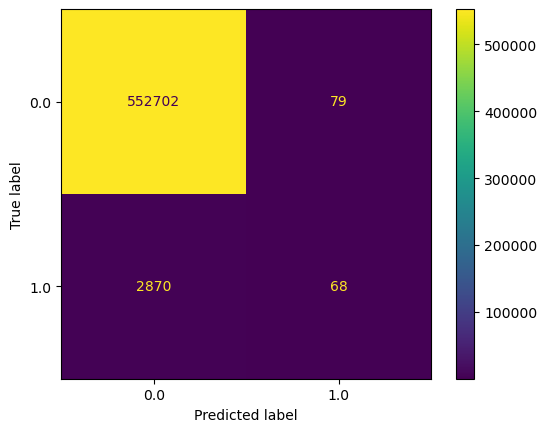

In [40]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
conf_matrix = confusion_matrix(y_test, y_pred, labels = logreg.classes_)
matrix_plot= ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels = logreg.classes_)
matrix_plot.plot()

In [41]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))


              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00    552781
         1.0       0.46      0.02      0.04      2938

    accuracy                           0.99    555719
   macro avg       0.73      0.51      0.52    555719
weighted avg       0.99      0.99      0.99    555719



In [42]:
y_pred_train = logreg.predict(x_train)
print(classification_report(y_train,y_pred_train))


              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00   1289962
         1.0       0.56      0.03      0.06      6713

    accuracy                           0.99   1296675
   macro avg       0.78      0.52      0.53   1296675
weighted avg       0.99      0.99      0.99   1296675



In [43]:
# Calculate balanced accuracy
from sklearn.metrics import balanced_accuracy_score
balanced_accuracy = balanced_accuracy_score(y_test,y_pred)
balanced_accuracy

0.5115010414282624

In [44]:
#  apply threshold to positive probabilities to create labels
# def to_labels(pos_probs, threshold):
#  return (pos_probs >= threshold).astype('int')

# thresholds = np.arange(0, 1, 0.001)
# # evaluate each threshold
# y_pred_probs = logreg.predict_proba(x_test)[:,1]
# scores = [balanced_accuracy_score(y_test, to_labels(y_pred_probs, t)) for t in thresholds]
# # get best threshold
# ix = argmax(scores)
# print('Threshold=%.3f, Balanced accuracy=%.5f' % (thresholds[ix], scores[ix]))

Best Threshold= 0.005193, Balanced accuracy= 0.71473


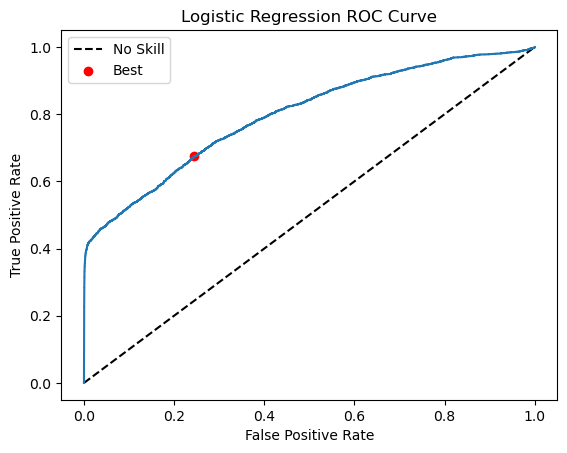

In [45]:
# roc curve for logistic regression model with optimal threshold for balanced accuracy
from sklearn.metrics import roc_curve
from numpy import argmax
y_pred_probs = logreg.predict_proba(x_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
# calculate the balanced accuracy for each threshold
balanced_accuracy = (tpr + (1 - fpr))/2
# locate the index of the largest balanced accuracy
ix = argmax(balanced_accuracy)
print('Best Threshold= %f, Balanced accuracy= %.5f' % (thresholds[ix], balanced_accuracy[ix]))

plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='red', label='Best')
plt.legend()
plt.show()


In [46]:
from sklearn.metrics import roc_auc_score
print(roc_auc_score(y_test,y_pred_probs))

0.7969751158191352


In [47]:
#importances of features in model 
importances = pd.DataFrame(data ={
    'Features': x_train.columns,
    'Importance': logreg.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending = False)

In [48]:
importances

,Features,Importance
0,amt,35.927850
1,trans_hour,3.341878
12,category_grocery_pos,2.268811
16,category_misc_net,1.824790
7,age,1.710021
27,job_Careers adviser,1.699897
25,job_Armed forces technical officer,1.520047
19,category_shopping_net,1.364243
37,job_Information officer,1.305595
30,job_Dancer,1.226417


# Desision Tree

In [49]:
#Decision Tree
from sklearn import tree

In [50]:
tree_clf = tree.DecisionTreeClassifier()
tree_clf.fit(x_train, y_train)

DecisionTreeClassifier()

In [53]:
y_tree_pred_train = tree_clf.predict(x_train)
y_tree_pred_test= tree_clf.predict(x_test)
print(f'Balanced accuracy of train set: {balanced_accuracy_score(y_train, y_tree_pred_train)}')
print(f'Balanced accuracy of test set: {balanced_accuracy_score(y_test, y_tree_pred_test)}')


Balanced accuracy of train set: 1.0
Balanced accuracy of test set: 0.9000609060969024


In [54]:
print(classification_report(y_test,y_tree_pred_test))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    552781
         1.0       0.79      0.80      0.80      2938

    accuracy                           1.00    555719
   macro avg       0.90      0.90      0.90    555719
weighted avg       1.00      1.00      1.00    555719



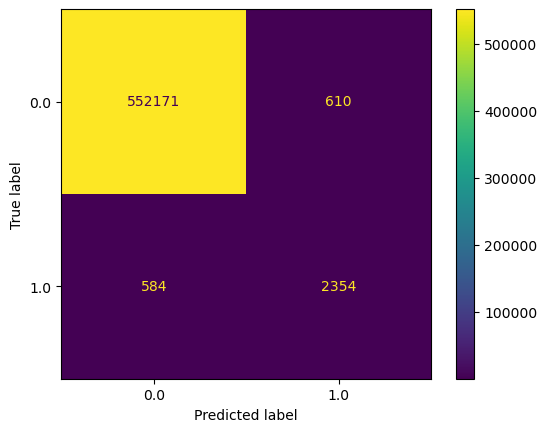

In [55]:
conf_matrix = confusion_matrix(y_test, y_tree_pred_test, labels = tree_clf.classes_)
matrix_plot= ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels = tree_clf.classes_)
matrix_plot.plot()

In [57]:
feats ={}
for feature, importance in zip(x_test.columns, tree_clf.feature_importances_):
    feats[feature] = importance

importances = pd.DataFrame.from_dict(feats, orient = 'index').rename(columns={0:'Gini-importance'})
importances = importances.sort_values(by='Gini-importance',ascending = False)

importances = importances.reset_index()

In [58]:
importances


,index,Gini-importance
0,amt,0.285791
1,category_grocery_pos,0.204933
2,trans_hour,0.153743
3,age,0.099774
4,category_gas_transport,0.066588
5,merch_lat,0.035465
6,merch_long,0.031482
7,lat,0.026440
8,trans_month,0.022907
9,long,0.021979


# Random Forest

In [59]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier

randfor_clf = RandomForestClassifier(random_state = 42)

randfor_clf.fit(x_train, y_train)

y_rf_pred_train = randfor_clf.predict(x_train)
y_rf_pred_test = randfor_clf.predict(x_test)


In [60]:
print(f'Balanced accuracy of train set: {balanced_accuracy_score(y_train, y_rf_pred_train)}')
print(f'Balanced of test set: {balanced_accuracy_score(y_test, y_rf_pred_test)}')


Balanced accuracy of train set: 0.9999255176523164
Balanced of test set: 0.8756916566713395


# Conclusion